# Pasos a Seguir:
1) identificar de donde salen las Rutas que estan en noExisten
2) usar funcion extraer_fecha y extraer_hora para comparar las fechas de las imagenes en la base dfetiquetadas para ver si estan bien, si no estan bien habria que volver a identificar sus rutas.
3) hacer EDA

# Proyecto Final - Rewilding: Automatización del Proceso de Clasificación de Imágenes.

*Problema:* los procesos de estimacion de abundancia de especies que utiliza Rewilding actualmente no son eficientes y eficaces. Por lo que los resultados son mejorables.

*Solucion:* automatizar procesos con AI :) 

In [81]:
# Se importan las librerias necesarias.
import collections
from collections import Counter
from datetime import datetime as dt
import gc
import json
import random
import re

import boto3
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image, ImageDraw
from io import BytesIO
import io
from IPython.display import display
import requests
import pytesseract
from unidecode import unidecode

from funciones import definirRuta, extraerFecha, extraerHora

## Base de Datos:

Se obtuvo la base de datos de los últimos proyectos de captura de imágenes con cámaras trampa. La base está segmentada según la zona, el año y la cámara.

### S3

La base esta almacenada en AWS en un bucket de S3. Se puede acceder con los accessKey de cada usuario habilitado.

In [2]:
# Importo Informacion del AccessKey.
accessKey = pd.read_csv("ANoguera_accessKeys.csv")

In [3]:
# Configura tus credenciales de AWS si aún no lo has hecho
boto3.setup_default_session(aws_access_key_id=accessKey["Access key ID"][0],
                           aws_secret_access_key=accessKey["Secret access key"][0],
                           region_name='us-east-2')

In [4]:
# Nombre del bucket
nombre_bucket_s3 = 's3-pfa'

In [5]:
# Crea un cliente de S3
s3 = boto3.client('s3')

### Dimensiones de la Base

In [6]:
# Obtengo todas las rutas de las imagenes en S3
paginator = s3.get_paginator('list_objects_v2')
pages = paginator.paginate(Bucket=nombre_bucket_s3)
objetos_s3 = []

for page in pages:
    for obj in page['Contents']:
        objetos_s3.append(obj['Key'])

In [7]:
# Cantidad de Imagenes: 
len(objetos_s3) 

165085

### Overview de las Imagenes

In [8]:
# Veo imagenes random de sauce 2022.
sauce_2022 = [ruta for ruta in objetos_s3 if ruta.startswith("Muestreo ct sauce/CT S 2022")]
random.shuffle(sauce_2022)
minidf = sauce_2022[:16]

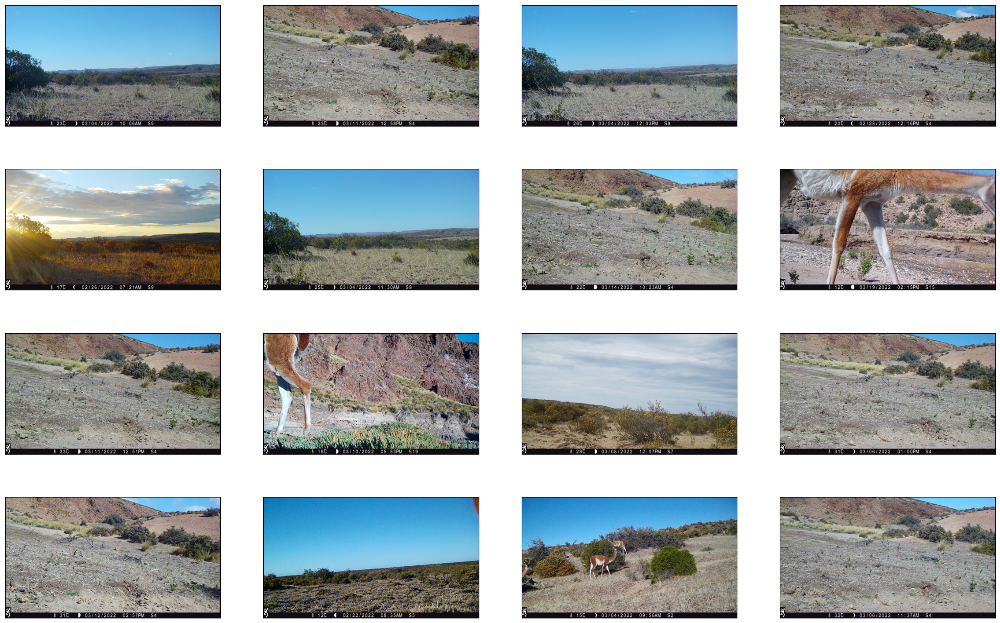

In [9]:
# Crea una figura de 4x4 para mostrar las imágenes en una cuadrícula
fig = plt.figure(figsize=(25, 16))

# Recorre las imágenes y muestra cada una en un subplot
for i, minidf in enumerate(minidf):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    response = s3.get_object(Bucket=nombre_bucket_s3, Key=minidf)
    image_data = response['Body'].read()
    im = Image.open(BytesIO(image_data))
    im = im.resize((480,270))
    plt.imshow(im)


En esta muestra de 16 imagenes random de la base se puede ver:
- Solo 5 de las 16 imagenes presentan animales en ellas.
- Hay imagenes que parecen iguales porque al ser una camara trampa siempre esta fija en el mismo lugar, pero si se ven las fechas son distintas.

### Dataframe

In [10]:
# Ruta del dataframe.
ruta_archivo_s3 = 'Muestreo_CT_PatAzul_2020-2023.xlsx'
# Descarga el archivo desde S3
response = s3.get_object(Bucket=nombre_bucket_s3, Key=ruta_archivo_s3)

In [11]:
# Lee el contenido del archivo Excel en un DataFrame de Pandas
excel_data = response['Body'].read()
df = pd.read_excel(BytesIO(excel_data))

In [12]:
# Elimino las columnas vacias --> OJO: hay algunas que tienen datos random tirados por ahi, ni lo revise...
df = df.iloc[:,:8]

In [13]:
# Preview de la base
df

,Sitio,Año,Cámara,Especie,Cantidad,Nombre,Fecha,Hora
0,Sauce,2020,S1,Guanaco,1.0,0-S1- (3).JPG,2020-02-05,20:46:22
1,Sauce,2020,S1,Guanaco,1.0,0-S1- (4).JPG,2020-02-05,20:47:10
2,Sauce,2020,S1,Guanaco,1.0,0-S1- (5).JPG,2020-02-05,20:47:12
3,Sauce,2020,S1,Guanaco,1.0,0-S1- (6).JPG,2020-02-05,20:47:16
4,Sauce,2020,S1,Guanaco,4.0,0-S1- (7).JPG,2020-02-05,20:51:48
...,...,...,...,...,...,...,...,...
2643,Ibérica,2022,IB7,Choique,1.0,IB 22 (6).JPG,2022-05-05,17:57:50
2644,Ibérica,2022,IB7,Choique,1.0,IB 22 (11).JPG,2022-05-13,8:30:26
2645,Ibérica,2022,IB7,Choique,1.0,IB 22 (15).JPG,2022-05-13,8:30:34
2646,Ibérica,2022,IB7,Guanaco,1.0,IB 22 (22).JPG,2022-05-14,8:35:10


In [14]:
# Informacion de la base
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2648 entries, 0 to 2647
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Sitio     2648 non-null   object        
 1   Año       2648 non-null   int64         
 2   Cámara    2648 non-null   object        
 3   Especie   2648 non-null   object        
 4   Cantidad  2644 non-null   float64       
 5   Nombre    2648 non-null   object        
 6   Fecha     2648 non-null   datetime64[ns]
 7   Hora      2648 non-null   object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(5)
memory usage: 165.6+ KB


- No hay nulos
- Hay 2648 datos

#### Representacion de los datos sobre el total de imagenes:

In [15]:
# Cantidad de registros etiquetados.
len(df)

2648

In [16]:
paths_filtrados = []

for path in objetos_s3:
    # Buscar "Muestreo ct Iberica" o "Muestreo ct sauce" en el path
    if "Muestreo ct Iberica" in path or "Muestreo ct sauce" in path:
        # Buscar el año en el path
        year_start = path.find("20")
        if year_start != -1:
            # Intentar extraer el año en formato "20XX"
            try:
                año = int(path[year_start:year_start+4])
                if año < 2023:
                    paths_filtrados.append((path, año))
            except ValueError:
                # Si no se puede convertir a int, intentar encontrar un año en el formato "CT S 2020"
                match = re.search(r'\b(20\d{2})\b', path)
                if match:
                    año = int(match.group(0))
                    if año < 2023:
                        paths_filtrados.append((path, año))

In [17]:
# Cantidad de imagenes (para años anteriores a 2023) # 2,351 + 39,869
len(paths_filtrados)

42220

In [18]:
# Definir la paleta de colores
colores = [ '#2B3B52', '#355028', '#25401B', '#907766', '#FDFBF8']

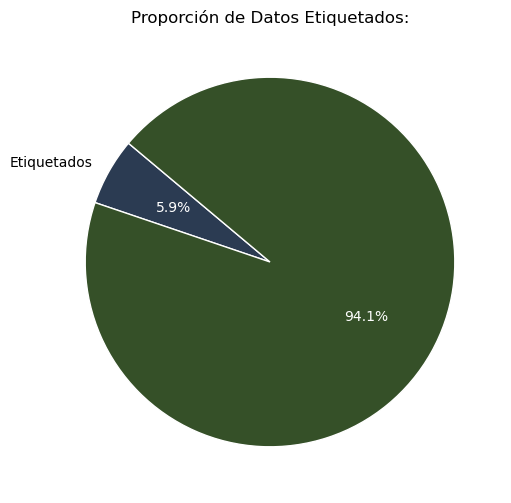

In [19]:
# Crear un gráfico de torta
fig, ax = plt.subplots(figsize=(6, 6))
patches, texts, autotexts = ax.pie(
    (len(df), len(paths_filtrados)),
    labels=('Etiquetados', ''),
    autopct='%1.1f%%',
    startangle=140,
    colors=colores,
    wedgeprops={'edgecolor': 'white'}  
)

for text in autotexts:
    text.set_color('white')

plt.title('Proporción de Datos Etiquetados:')
plt.show()

In [20]:
# Cantidad de datos para cada Sitio
df['Sitio'].value_counts()

Sauce      2300
Ibérica     348
Name: Sitio, dtype: int64

In [21]:
# Imprimo las especies presentadas.
print(df['Especie'].unique())
print(len(df['Especie'].unique()))

['Guanaco' 'Zorro Gris' 'Martineta' 'Choique' 'Gato montés' 'passeriforme'
 'Liebre' 'peludo' 'Mara' 'Tucuquere' 'Passeriforme' 'Gaviota' 'Jote'
 'Peludo' 'Piche' 'Chimango' 'Ave S/I' 'Flamenco' 'Aguila Mora' 'Zorrino'
 'Puma' 'Pato' 'Garza Blanca' 'Halcon' 'atahacaminos' 'Bandurrita'
 'Chingolo' 'Ratón' 'Loica' 'Calandria ' 'Zorzal chiguanco'
 'Zorzal Chiguanco' 'Oveja' 'Yal negro' 'Zorrino ' 'Torcaza'
 'Zorro Colorado' 'Carancho' 'Bandurria' 'Aguilucho Comun'
 'Cormoran Imperial' 'Cauquen']
42


#### Normalizacion de Texto

In [22]:
# Eliminar los espacios enfrente y atras de las variables.
df = df.applymap(lambda x: x.strip() if isinstance(x, str) else x)

In [23]:
# Le saco las tildes a la base:
df.rename(columns={'Cámara': 'Camara'}, inplace=True)
df = df.applymap(lambda x: unidecode(x) if isinstance(x, str) else x)

In [24]:
# Lo convierto a minusculas
df['Especie'] = df['Especie'].str.lower()

In [25]:
# Le saco los espacios dobles.
df = df.applymap(lambda x: x.replace('  ',' ') if isinstance(x, str) else x)

#### Normalizacion de Tipos de Dato:

In [26]:
df['Hora'] = pd.to_datetime(df['Hora'], format="%H:%M:%S").dt.strftime("%H:%M")

#### Normalizar Especies

In [ ]:
df.loc[df['Especie']=='bandurrita', 'Especie'] = 'bandurria'

In [27]:
# Imprimo las especies presentadas.
print(df['Especie'].unique())
print(len(df['Especie'].unique()))

['guanaco' 'zorro  gris' 'martineta' 'choique' 'gato  montes'
 'passeriforme' 'liebre' 'peludo' 'mara' 'tucuquere' 'gaviota' 'jote'
 'piche' 'chimango' 'ave  s/i' 'flamenco' 'aguila  mora' 'zorrino' 'puma'
 'pato' 'garza  blanca' 'halcon' 'atahacaminos' 'bandurrita' 'chingolo'
 'raton' 'loica' 'calandria' 'zorzal  chiguanco' 'oveja' 'yal  negro'
 'torcaza' 'zorro  colorado' 'carancho' 'bandurria' 'aguilucho  comun'
 'cormoran  imperial' 'cauquen']
38


Que hacemos con 'ave s/i'?

#### Normalizar Ruta Archivo

El dataframe no tiene la informacion exacta de la ruta por lo que se crea esta funcion que lo normaliza.

In [38]:
def defRuta(fila):
    ruta = 'Muestreo ct '
    if fila['Sitio'] == 'Sauce':
        ruta += 'sauce/CT S ' + str(fila['Año']) + '/' + str(fila['Camara']) + '/' + fila['Nombre']
    elif fila['Sitio'] == "Iberica":
        ruta += "Iberica/" + str(fila['Año']) + '/' + fila['Camara'] + '/' + fila['Nombre']
    else:
        raise ValueError("No existe esa ruta.")
    if ruta in objetos_s3:
        return ruta
    return ''

In [39]:
df['Ruta'] = df.apply(defRuta, axis=1)

In [40]:
df['esta'] = df['Ruta'].apply(lambda x: False if x =='' else True)

In [41]:
df['esta'].value_counts()

False    2258
True      390
Name: esta, dtype: int64

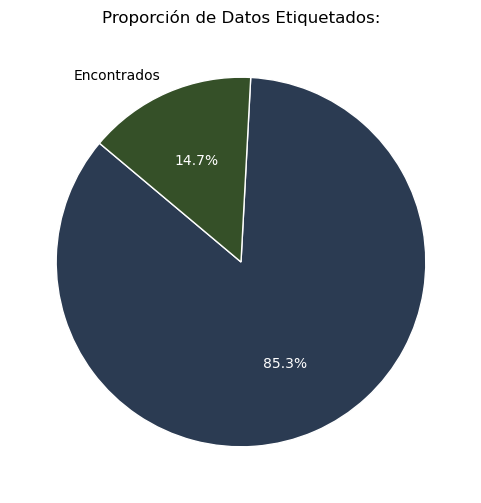

In [42]:
# Crear un gráfico de torta
fig, ax = plt.subplots(figsize=(6, 6))
patches, texts, autotexts = ax.pie(
    df['esta'].value_counts(),
    labels=("","Encontrados"),
    autopct='%1.1f%%',
    startangle=140,
    colors=colores,
    wedgeprops={'edgecolor': 'white'}  
)

for text in autotexts:
    text.set_color('white')

plt.title('Proporción de Datos Etiquetados:')
plt.show()

La ruta no solo depende del sitio, ademas depende del año, la camara, el nombre... Se necesita una funcion de definirRuta mucho mas explicita.

In [43]:
df['Ruta'] = df.apply(definirRuta, axis=1)

In [44]:
df['esta'] = df['Ruta'].apply(lambda x: False if x == '' else True)

In [45]:
df['esta'].value_counts()

False    1861
True      787
Name: esta, dtype: int64

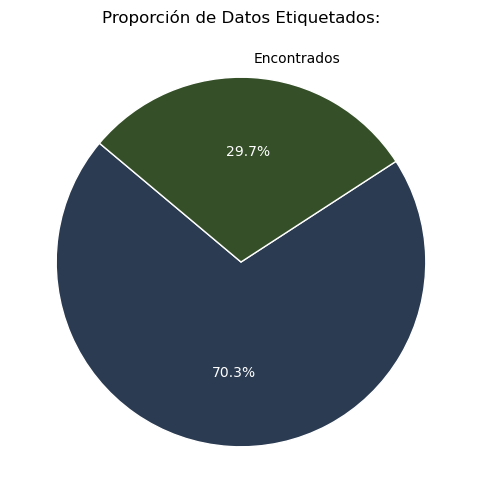

In [46]:
# Crear un gráfico de torta
fig, ax = plt.subplots(figsize=(6, 6))
patches, texts, autotexts = ax.pie(
    df['esta'].value_counts(),
    labels=("","Encontrados"),
    autopct='%1.1f%%',
    startangle=140,
    colors=colores,
    wedgeprops={'edgecolor': 'white'}  
)

for text in autotexts:
    text.set_color('white')

plt.title('Proporción de Datos Etiquetados:')
plt.show()

Las imagenes a las que se les encontro la ruta en la base se las sometio a un segundo checkeo. Esto se realizo utilizando las funciones extraerFecha() y extraerHora() que extraen los datos Fecha y Hora de la imagen.

In [181]:
# Cargar el DataFrame desde el archivo pickle
df = pd.read_pickle('df.pkl')

In [182]:
df['Ruta'] = df.apply(definirRuta, axis=1)

In [183]:
df['esta'] = df['Ruta'].apply(lambda x: False if x == '' else True)

In [184]:
df['esta'].value_counts()

True     2293
False     355
Name: esta, dtype: int64

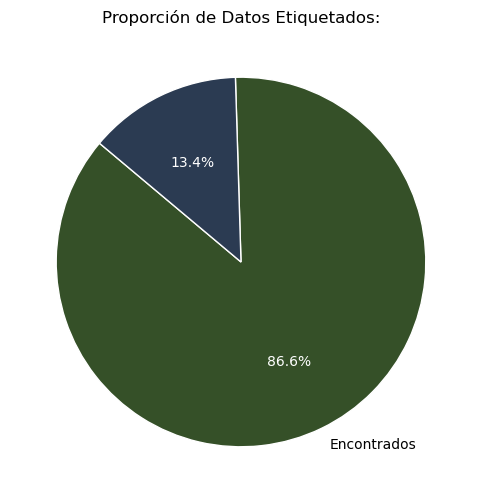

In [185]:
# Crear un gráfico de torta
fig, ax = plt.subplots(figsize=(6, 6))
patches, texts, autotexts = ax.pie(
    df['esta'].value_counts(),
    labels=("Encontrados",''),
    autopct='%1.1f%%',
    startangle=140,
    colors=(colores[1],colores[0]),
    wedgeprops={'edgecolor': 'white'}  
)

for text in autotexts:
    text.set_color('white')

plt.title('Proporción de Datos Etiquetados:')
plt.show()

Luego de un trabajo exhaustivo para encontrar las correlaciones entre las rutas de las imagenes, se logro ajustarlas para reducir el porcentaje de no encontradas a un 13.4%. No se le ve valor a seguir con el trabajo ya que es muy demandante.

In [52]:
noExiste = df[df['esta']==False]

In [186]:
pd.crosstab([noExiste['Sitio'],noExiste['Año'],noExiste['Camara']],noExiste['Rota'])

Rota                 False
Sitio   Año  Camara       
Iberica 2021 IB6         1
Sauce   2020 S17         5
             S19         3
        2021 S1          1
             S13         1
             S15         2
             S17         1
             S2          2
             S7          1
        2022 S11         5
             S13        54
             S14        10
             S16        56
             S17        61
             S18        10
             S19        29
             S2         15
             S3         21
             S4         13
             S5         11
             S6         35
             S7         16
             S8          2

#### Missings Cantidad

Se reviso las 4 imagenes donde no se le asigna valor a cantidad y se conto manual

In [203]:
df.loc[df['Cantidad'].isna(), 'Cantidad']  = (3, 1, 1, 1)

### Base Etiquetada:

In [54]:
# Agarro solo las rutas donde se encontro match en S3.
dfetiquetas = df.loc[df['esta']==True,('Ruta','Cantidad', 'Especie','Fecha','Hora')]

In [ ]:
# dfetiquetas['checkFecha'] = dfetiquetas['Ruta'].apply(extraerFecha)

In [31]:
# Guardar el DataFrame en un archivo pickle
# dfetiquetas.to_pickle('dfetiquetas.pkl')

In [56]:
# Cargar el DataFrame desde el archivo pickle
dfetiquetas = pd.read_pickle('dfetiquetas.pkl')

In [59]:
dfImagenesRotas = dfetiquetas[dfetiquetas['checkFecha'] == '']

In [60]:
dfcheck = dfetiquetas[dfetiquetas['checkFecha'] != '']

In [506]:
%store dfcheck

Stored 'dfcheck' (DataFrame)


In [62]:
dfcheck = pd.read_pickle('dfcheck.pkl')

In [63]:
dfcheck # Len = 2151

,Ruta,Cantidad,Especie,Fecha,Hora,checkFecha
0,Muestreo ct sauce/CT S 2020/S1/0-S1- (3).JPG,1.0,guanaco,2020-02-05,20:46:22,2020-02-05
1,Muestreo ct sauce/CT S 2020/S1/0-S1- (4).JPG,1.0,guanaco,2020-02-05,20:47:10,2020-02-05
2,Muestreo ct sauce/CT S 2020/S1/0-S1- (5).JPG,1.0,guanaco,2020-02-05,20:47:12,2020-02-05
3,Muestreo ct sauce/CT S 2020/S1/0-S1- (6).JPG,1.0,guanaco,2020-02-05,20:47:16,2020-02-05
4,Muestreo ct sauce/CT S 2020/S1/0-S1- (7).JPG,4.0,guanaco,2020-02-05,20:51:48,2020-02-05
...,...,...,...,...,...,...
2162,Muestreo ct sauce/CT S 2022/S15/IMG_1636.JPG,1.0,guanaco,2022-03-15,14:08,2022-03-15
2163,Muestreo ct sauce/CT S 2022/S15/IMG_1641.JPG,1.0,guanaco,2022-03-15,14:08,2022-03-15
2164,Muestreo ct sauce/CT S 2022/S15/IMG_1650.JPG,1.0,guanaco,2022-03-15,14:09,2022-03-15
2165,Muestreo ct sauce/CT S 2022/S15/IMG_1652.JPG,1.0,guanaco,2022-03-15,14:09,2022-03-15


In [64]:
# las distintas.
dfcheck[dfcheck['Fecha']!=dfcheck['checkFecha']]

,Ruta,Cantidad,Especie,Fecha,Hora,checkFecha
1145,Muestreo ct sauce/CT S 2021/S7/1-S7- (6).JPG,1.0,guanaco,2021-03-17,08:41:56,2021-03-07
1600,Muestreo ct sauce/CT S 2022/S1/1/1-S1- (7).JPG,1.0,guanaco,2022-02-19,14:03:44,2022-02-22
1617,Muestreo ct sauce/CT S 2022/S2/4/IMG_0654.JPG,2.0,guanaco,2022-02-24,19:54:06,2022-02-25
1622,Muestreo ct sauce/CT S 2022/S2/4/IMG_0784.JPG,1.0,guanaco,2022-03-01,8:07:30,2022-03-02
1623,Muestreo ct sauce/CT S 2022/S4/IMG_6114.JPG,1.0,zorrino,2022-02-18,01:08:42,2022-03-11
...,...,...,...,...,...,...
1765,Muestreo ct sauce/CT S 2022/S11/IMG_0104.JPG,1.0,guanaco,2022-03-05,23:27:56,2022-03-19
1766,Muestreo ct sauce/CT S 2022/S11/IMG_0132.JPG,1.0,guanaco,2022-03-07,06:37:24,2022-03-19
1767,Muestreo ct sauce/CT S 2022/S11/IMG_0148.JPG,1.0,guanaco,2022-03-07,06:38:28,2022-03-19
1768,Muestreo ct sauce/CT S 2022/S11/IMG_0161.JPG,1.0,zorro gris,2022-03-08,02:51:42,2022-03-19


In [65]:
# Guardar el DataFrame en un archivo pickle
dfcheck.to_pickle('dfcheck.pkl')

#### Visualizacion de la Base

In [66]:
# Extraigo 16 imagenes random del dataset.
minidf = random.sample(dfetiquetas['Ruta'].tolist(), 16)

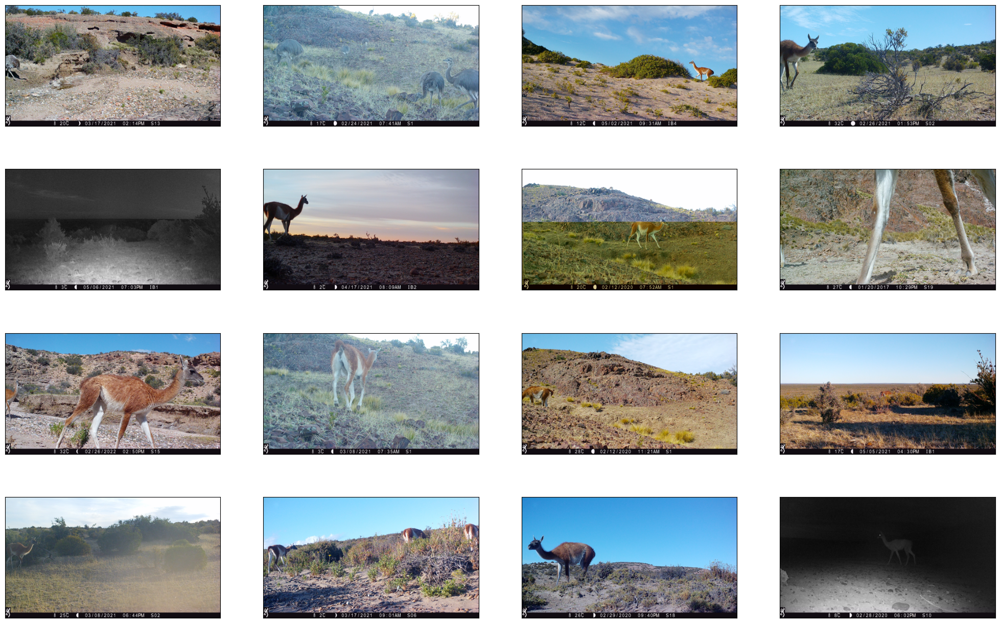

In [72]:
# Crea una figura de 4x4 para mostrar las imágenes en una cuadrícula
fig = plt.figure(figsize=(25, 16))

# Recorre las imágenes y muestra cada una en un subplot
for i, minidf in enumerate(minidf):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    response = s3.get_object(Bucket=nombre_bucket_s3, Key=minidf)
    image_data = response['Body'].read()
    im = Image.open(BytesIO(image_data))
    im = im.resize((480,270))
    plt.imshow(im)

#### Distribucion de las Especies:

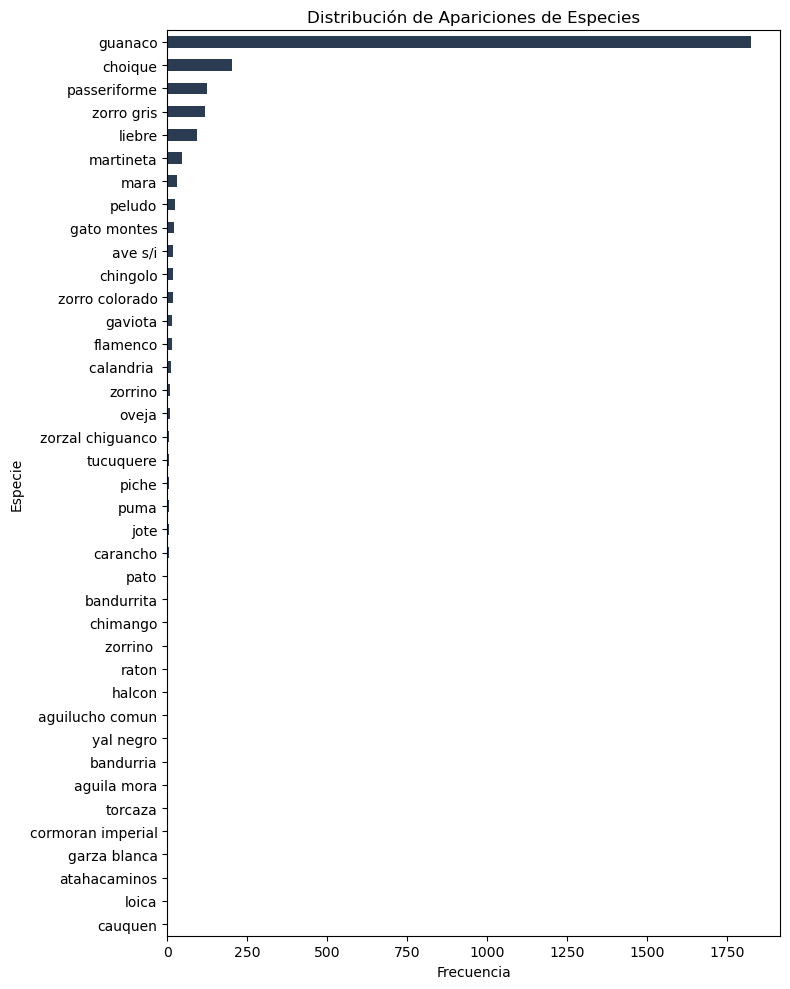

In [166]:

# Cuenta la frecuencia de cada especie y ordena de mayor a menor
especies_frecuencia = df['Especie'].value_counts().sort_values(ascending=True)

# Crea un gráfico de barras horizontal
plt.figure(figsize=(8, 10))  # Ajusta el tamaño si es necesario
especies_frecuencia.plot(kind='barh', color = colores[0])  # Usa 'barh' para gráfico de barras horizontal
plt.xlabel('Frecuencia')
plt.ylabel('Especie')
plt.title('Distribución de Apariciones de Especies')
plt.tight_layout()
plt.show()

In [199]:
# Listas de categorías
aves = ('martineta', 'choique', 'passeriforme', 'tucuquere', 'gaviota', 'jote', 'chimango', 'ave s/i', 'flamenco', 'aguila mora', 'garza blanca', 'halcon', 'atahacaminos', 'bandurria', 'chingolo', 'loica', 'calandria', 'zorzal chiguanco', 'yal negro', 'torcaza', 'carancho', 'aguilucho comun', 'cormoran imperial', 'cauquen', 'pato')
roedor = ('raton', 'piche')
mam_herbivoro = ('guanaco', 'liebre', 'mara', 'oveja', 'piche')
mam_carnivoro = ('zorro gris', 'gato montes', 'peludo', 'zorrino', 'puma', 'zorro colorado', 'raton')

In [200]:
# Función para asignar categoría
def asignar_categoria(especie):
    if especie in aves:
        return 'Ave'
    elif especie in mam_herbivoro:
        return 'Mamifero Herbivoro'
    elif especie in mam_carnivoro:
        return 'Mamifero Carnivoro'
    else:
        return 'Otra'  # Puedes cambiar esto según tus necesidades

In [201]:
# Aplicar la función para crear una nueva columna 'Categoria'
df['Categoria'] = df['Especie'].apply(asignar_categoria)

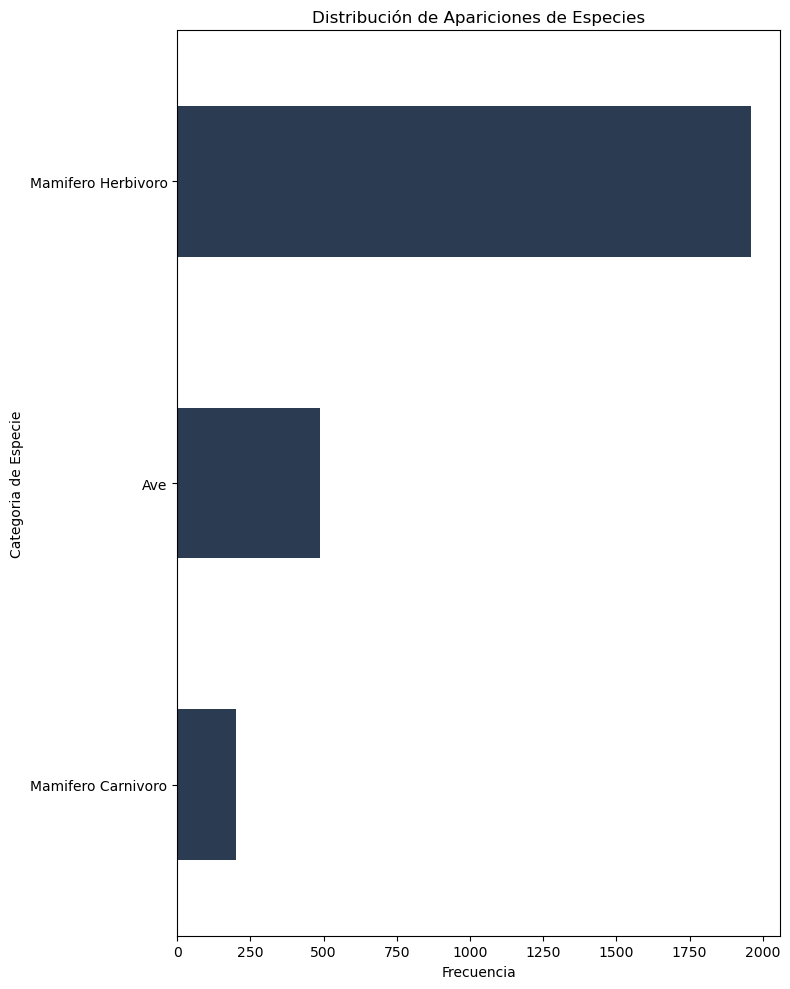

In [202]:
# Cuenta la frecuencia de cada especie y ordena de mayor a menor
especies_frecuencia = df['Categoria'].value_counts().sort_values(ascending=True)

# Crea un gráfico de barras horizontal
plt.figure(figsize=(8, 10))  # Ajusta el tamaño si es necesario
especies_frecuencia.plot(kind='barh', color = colores[0])  # Usa 'barh' para gráfico de barras horizontal
plt.xlabel('Frecuencia')
plt.ylabel('Categoria de Especie')
plt.title('Distribución de Apariciones de Especies')
plt.tight_layout()
plt.show()

#### Error en el etiquetado: 

Se encontro esta imagen que esta etiquetada como Passseriforme y cantidad 1.

In [548]:
# Imagen etiquetada como Passeriforme cantidad 1
df[df['Ruta']=="Muestreo ct sauce/CT S 2020/S17/z-S17 (2792).JPG"] 

,Sitio,Año,Camara,Especie,Cantidad,Nombre,Fecha,Hora,Ruta,esta
709,Sauce,2020,S17,Passeriforme,1.0,z-S17 (2792).JPG,2020-03-01,02:23:04,Muestreo ct sauce/CT S 2020/S17/z-S17 (2792).JPG,True


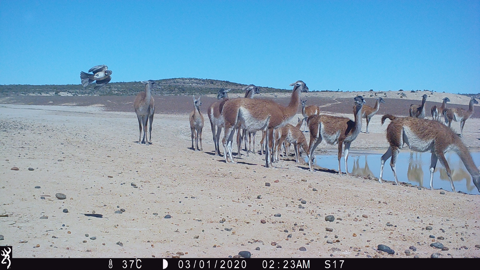

In [547]:
ruta_imagen_s3 = "Muestreo ct sauce/CT S 2020/S17/z-S17 (2792).JPG"

# Descarga la imagen desde S3
response = s3.get_object(Bucket=nombre_bucket_s3, Key=ruta_imagen_s3)

# Lee los datos de la imagen
datos_imagen = response['Body'].read()

# Abre la imagen utilizando Pillow
imagen = Image.open(BytesIO(datos_imagen))

imagen = imagen.resize((480,270))

# Muestra la imagen en el Jupyter Notebook
display(imagen)

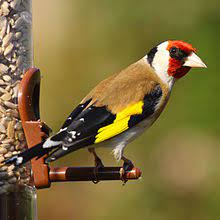

In [549]:
# Passeriforme: 
from IPython.display import Image
image_path = 'passeriforme.jpeg'
Image(filename=image_path)

Lo encontre jaajaj:

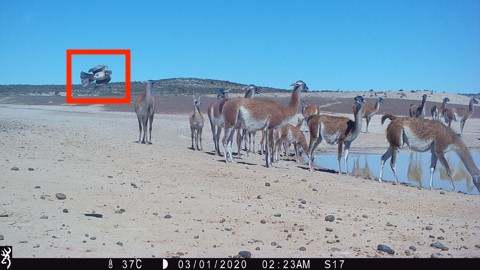

In [970]:
# Passeriforme: 
from IPython.display import Image
image_path = 'passeriformes3.png'
Image(filename=image_path)

##### Passeriforme:

In [967]:
# Extraigo 16 imagenes random etiquetadas como Passeriforme
minidf = random.sample(dfetiquetas.loc[dfetiquetas['Especie']=='passeriforme','Ruta'].tolist(), 16)

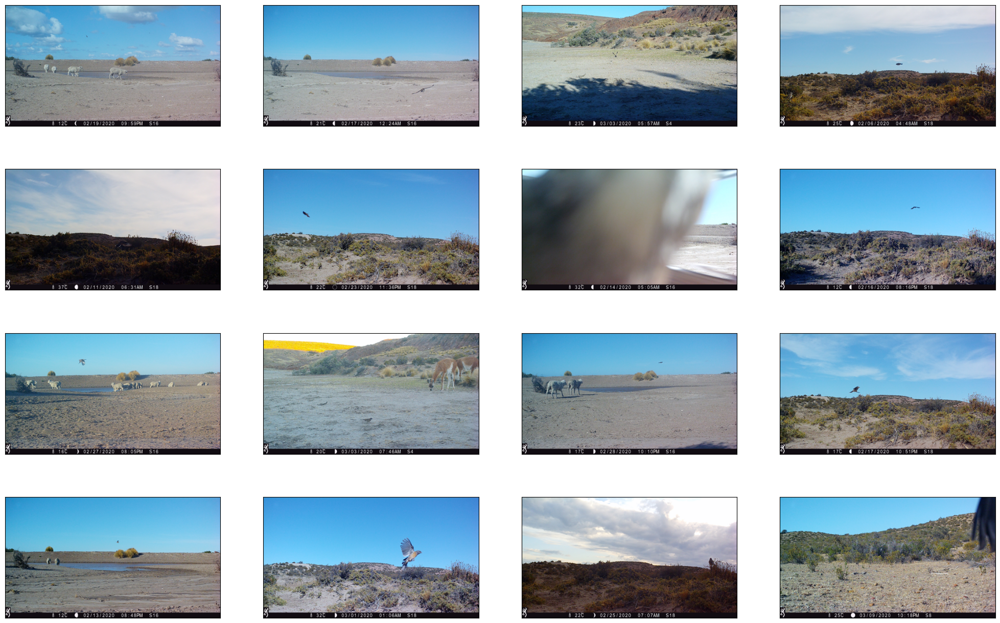

In [968]:
# Crea una figura de 4x4 para mostrar las imágenes en una cuadrícula
fig = plt.figure(figsize=(25, 16))

# Recorre las imágenes y muestra cada una en un subplot
for i, minidf in enumerate(minidf):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    response = s3.get_object(Bucket=nombre_bucket_s3, Key=minidf)
    image_data = response['Body'].read()
    im = Image.open(BytesIO(image_data))
    im = im.resize((480,270))
    plt.imshow(im)

##### Guanaco:

In [960]:
# Extraigo 16 imagenes random etiquetadas como Guanaco
minidf = random.sample(dfetiquetas.loc[dfetiquetas['Especie']=='Guanaco','Ruta'].tolist(), 16)

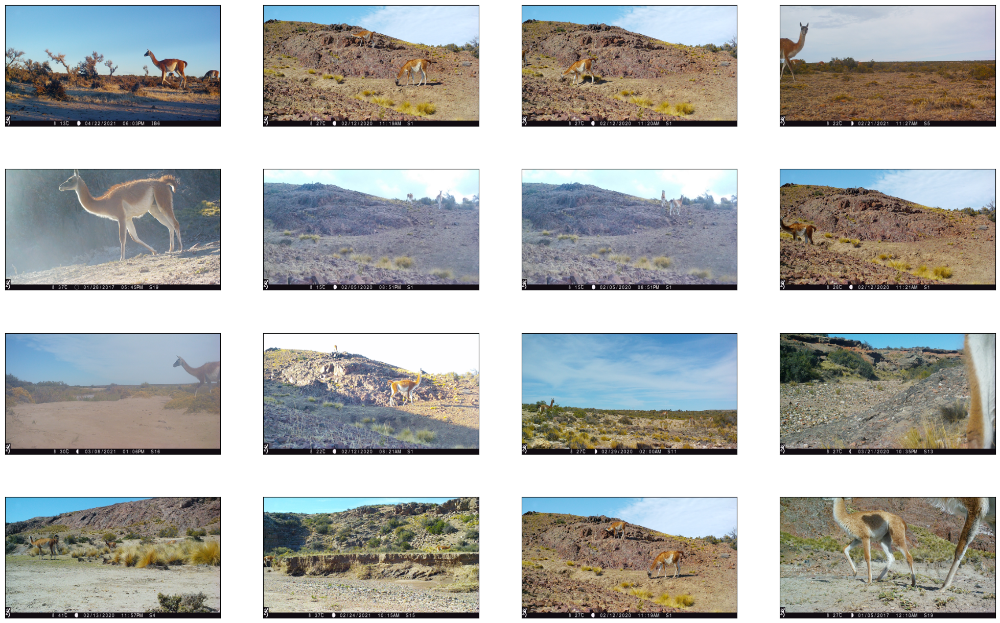

In [961]:
# Crea una figura de 4x4 para mostrar las imágenes en una cuadrícula
fig = plt.figure(figsize=(25, 16))

# Recorre las imágenes y muestra cada una en un subplot
for i, minidf in enumerate(minidf):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    response = s3.get_object(Bucket=nombre_bucket_s3, Key=minidf)
    image_data = response['Body'].read()
    im = Image.open(BytesIO(image_data))
    im = im.resize((480,270))
    plt.imshow(im)

#### Calidad de las Imagenes

*Calidad de Imágenes:* Se analizará la calidad de las imágenes. Se mostrará la distribución de imágenes oscuras o imágenes con baja visibilidad. Esto ayudará a identificar problemas técnicos con las cámaras o condiciones ambientales adversas.

In [187]:
# Extraigo 16 imagenes random del dataset.
# minidf = random.sample(dfetiquetas['Ruta'].tolist(), 160)
minidf = dfetiquetas[dfetiquetas['Ruta'] != '']['Ruta']

In [188]:
# Lista para almacenar la calidad de las imágenes
calidad_imagenes = []

# Lista para almacenar los niveles de luminosidad
niveles_de_luminosidad = []

# Itera sobre los objetos y analiza la calidad de las imágenes
for obj in minidf:
    try:
        # Descarga la imagen desde S3
        image_obj = s3.get_object(Bucket=nombre_bucket_s3, Key=obj)
        image_data = image_obj['Body'].read()
        
        # Convierte los datos en una imagen PIL
        img = Image.open(io.BytesIO(image_data))

        # Calcula la luminancia promedio de la imagen
        luminancia_promedio = np.array(img).mean()
        
        # Define un umbral para determinar si la imagen es oscura
        umbral_oscuridad = 100  # Ajusta este valor según tus necesidades
        
        # Clasifica la imagen como oscura o no
        calidad = "Oscura" if luminancia_promedio < umbral_oscuridad else "Buena"
        
        calidad_imagenes.append(calidad)

        # Agrega el nivel de luminosidad a la lista
        niveles_de_luminosidad.append(luminancia_promedio)

    except Exception as e:
        pass


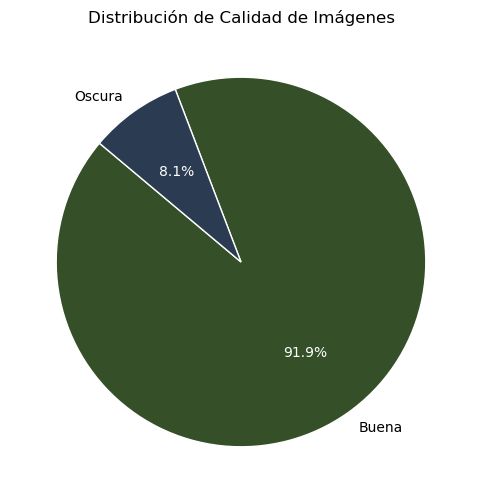

In [198]:
# Contar la cantidad de imágenes de cada calidad
conteo_calidades = Counter(calidad_imagenes)

# Extraer etiquetas y valores para el gráfico de barras
etiquetas = list(conteo_calidades.keys())
valores = list(conteo_calidades.values())

fig, ax = plt.subplots(figsize=(6, 6))
patches, texts, autotexts = ax.pie(
    valores,
    labels=etiquetas,
    autopct='%1.1f%%',
    startangle=140,
    colors=(colores[1],colores[0]),
    wedgeprops={'edgecolor': 'white'}  
)

for text in autotexts:
    text.set_color('white')

# Generar un gráfico de torta para mostrar la distribución de calidad
plt.title('Distribución de Calidad de Imágenes')
plt.show()

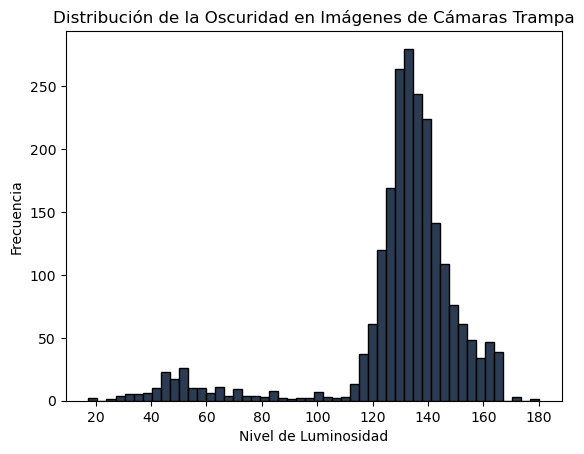

In [190]:
# Genera un histograma de los niveles de luminosidad
plt.hist(niveles_de_luminosidad, bins=50, edgecolor='k', color=colores[0])
plt.xlabel('Nivel de Luminosidad')
plt.ylabel('Frecuencia')
plt.title('Distribución de la Oscuridad en Imágenes de Cámaras Trampa')
plt.show()

Las imagenes totales siguen la misma distribucion de luminocidad?

In [163]:
paths_filtrados = []

for path in objetos_s3:
    # Buscar "Muestreo ct Iberica" o "Muestreo ct sauce" en el path
    if "Muestreo ct Iberica" in path or "Muestreo ct sauce" in path:
        # Buscar el año en el path
        year_start = path.find("20")
        if year_start != -1:
            # Intentar extraer el año en formato "20XX"
            try:
                año = int(path[year_start:year_start+4])
                if año == 2023:
                    paths_filtrados.append(path)
            except ValueError:
                # Si no se puede convertir a int, intentar encontrar un año en el formato "CT S 2020"
                match = re.search(r'\b(20\d{2})\b', path)
                if match:
                    año = int(match.group(0))
                    if año == 2023:
                        paths_filtrados.append(path)

In [164]:
# Extraigo 10000 imagenes random del dataset.
minidf = random.sample(paths_filtrados, 10000)

In [170]:
# Lista para almacenar la calidad de las imágenes
calidad_imagenes = []

# Lista para almacenar los niveles de luminosidad
niveles_de_luminosidad = []

# Itera sobre los objetos y analiza la calidad de las imágenes
for obj in minidf:
    try:
        # Descarga la imagen desde S3
        image_obj = s3.get_object(Bucket=nombre_bucket_s3, Key=obj)
        image_data = image_obj['Body'].read()
        
        # Convierte los datos en una imagen PIL
        img = Image.open(io.BytesIO(image_data))

        # Calcula la luminancia promedio de la imagen
        luminancia_promedio = np.array(img).mean()
        
        # Define un umbral para determinar si la imagen es oscura
        umbral_oscuridad = 100  # Ajusta este valor según tus necesidades
        
        # Clasifica la imagen como oscura o no
        calidad = "Oscura" if luminancia_promedio < umbral_oscuridad else "Buena"
        
        calidad_imagenes.append(calidad)

        # Agrega el nivel de luminosidad a la lista
        niveles_de_luminosidad.append(luminancia_promedio)
        
    except Exception as e:
        pass


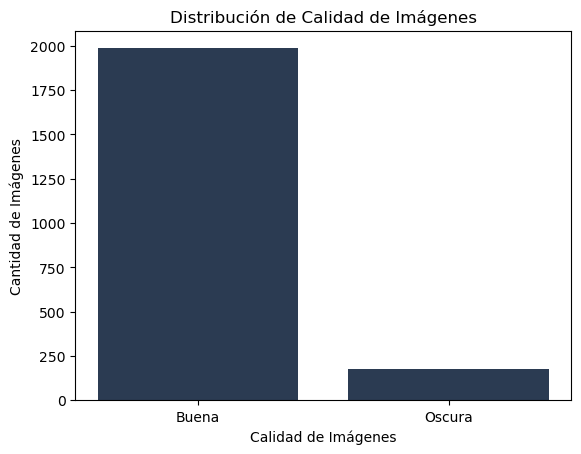

In [195]:
# Contar la cantidad de imágenes de cada calidad
conteo_calidades = Counter(calidad_imagenes)

# Extraer etiquetas y valores para el gráfico de barras
etiquetas = list(conteo_calidades.keys())
valores = list(conteo_calidades.values())

# Generar un gráfico de barras para mostrar la distribución de calidad
plt.bar(etiquetas, valores, color=colores[0])
plt.xlabel('Calidad de Imágenes')
plt.ylabel('Cantidad de Imágenes')
plt.title('Distribución de Calidad de Imágenes')
plt.show()

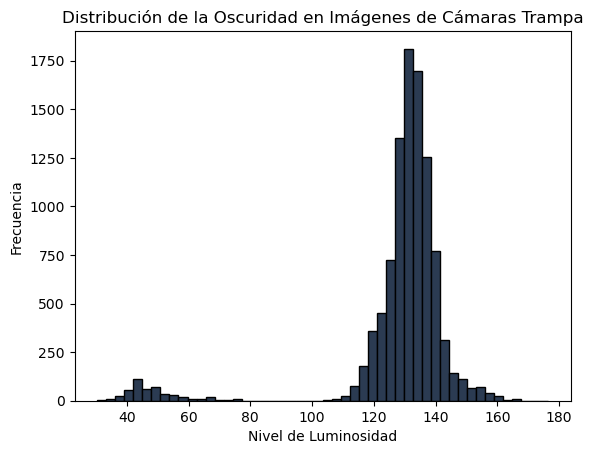

In [174]:
# Genera un histograma de los niveles de luminosidad
plt.hist(niveles_de_luminosidad, bins=50, edgecolor='k', color=colores[0])
plt.xlabel('Nivel de Luminosidad')
plt.ylabel('Frecuencia')
plt.title('Distribución de la Oscuridad en Imágenes de Cámaras Trampa')
plt.show()